In [37]:
# Import the modules
from pajek_converter import connections_to_pajek, get_available_neurotransmitters
from infomap_runner import run_complete_infomap_pipeline  
from connectome_gui import create_infomap_gui, quick_analysis

# Use the GUI
create_infomap_gui("connections_princeton.csv")

# Or run programmatically
#results = quick_analysis("connections_princeton.csv", ["GABA"], min_synapses=5)

In [38]:
# Import the analysis functions
from module_parser import parse_infomap_modules, get_module_summary, filter_modules_by_size
from module_visualizer import create_3d_module_plot, create_interactive_module_viewer, plot_module_size_distribution

import pandas as pd
import numpy as np

In [28]:
# Example with your current file structure
selected_nts = ['gaba']  # or whatever neurotransmitters you used
threshold = 5  # or your threshold value

# Build file paths (matching your current structure)
nt_clean = "_".join(sorted(nt.lower() for nt in selected_nts))
output_dir = f"output_{nt_clean}_thresh{threshold}"
tree_file = f"{output_dir}/{nt_clean}_thresh{threshold}_graph.tree"
pajek_file = f"{output_dir}/{nt_clean}_thresh{threshold}_graph.net"
coords_file = "coordinates.csv"

# Parse the module data
modules_df = parse_infomap_modules(
    tree_file=tree_file,
    pajek_file=pajek_file,
    coords_file=coords_file,
    max_levels=3  # Extract up to 3 hierarchical levels
)

print(f"Parsed {len(modules_df)} neurons")
print(f"Available columns: {list(modules_df.columns)}")
print(f"Sample data:\n{modules_df.head()}")

Parsed 211346 neurons
Available columns: ['neuron_id', 'module_path', 'level_1', 'level_2', 'level_3', 'root_id', 'position', 'supervoxel_id', 'x', 'y', 'z']
Sample data:
            neuron_id module_path  level_1  level_2  level_3  \
0  720575940625033196     1:1:1:1        1        1      1.0   
1  720575940625033196     1:1:1:1        1        1      1.0   
2  720575940617838009     1:1:1:2        1        1      1.0   
3  720575940617838009     1:1:1:2        1        1      1.0   
4  720575940631362553     1:1:1:3        1        1      1.0   

              root_id                position      supervoxel_id         x  \
0  720575940625033196  [728116 252632  90440]  83109335433291142  728116.0   
1  720575940625033196  [720284 246368 122920]  82968460573456534  720284.0   
2  720575940617838009  [692284 352008 132040]  82548034881548577  692284.0   
3  720575940617838009  [742440 257032 128560]  83390879263584033  742440.0   
4  720575940631362553  [742452 214336 163760]  8339012

In [39]:
# Filter to keep only large modules
filtered_df, large_module_ids = filter_modules_by_size(
    modules_df, 
    level=1, 
    min_size=20  # Only modules with ≥20 neurons
)

print(f"Kept {len(large_module_ids)} modules with ≥20 neurons")
print(f"Large modules: {large_module_ids}")
print(f"Filtered dataset: {len(filtered_df)} neurons")

Kept 6 modules with ≥20 neurons
Large modules: [2, 1, 3, 5, 4, 6]
Filtered dataset: 211269 neurons


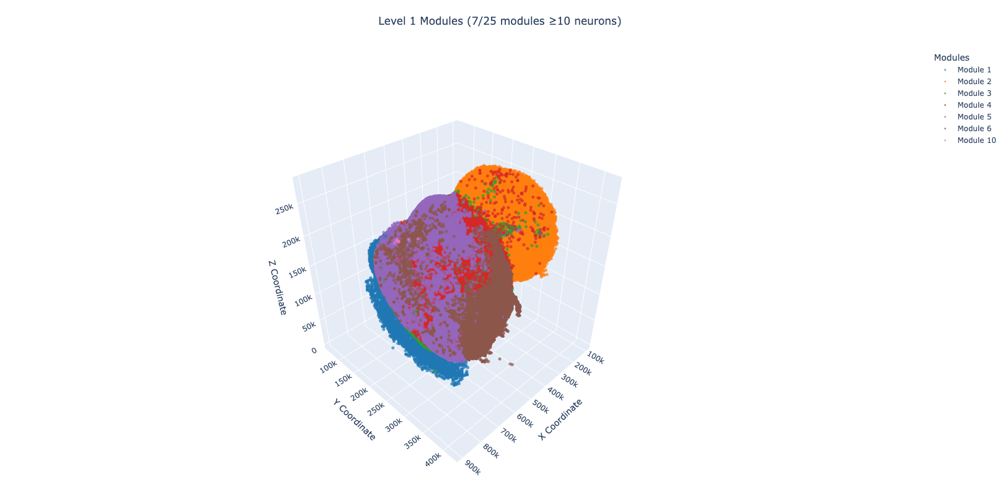

In [40]:
# Simple function call to visualize modules
fig = create_3d_module_plot(modules_df, level=1, min_module_size=10)
fig.show()

In [41]:
# Interactive widget with all controls
create_interactive_module_viewer(
    modules_df,
    neurotransmitters=selected_nts,
    threshold=threshold,
    default_min_size=10
)

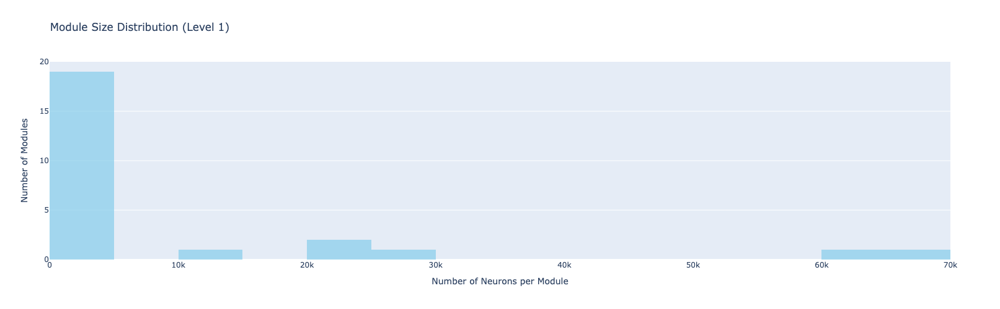

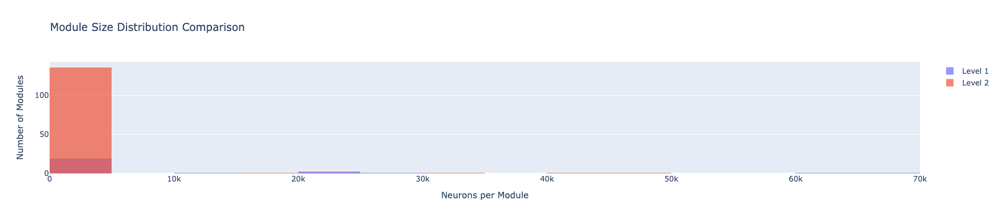

In [31]:
# Histogram of module sizes
fig_dist = plot_module_size_distribution(modules_df, level=1, bins=30)
fig_dist.show()

# Compare distributions across levels
import plotly.graph_objects as go
fig_compare = go.Figure()

for level in [1, 2]:
    level_col = f"level_{level}"
    if level_col in modules_df.columns:
        sizes = modules_df[level_col].value_counts().values
        fig_compare.add_trace(go.Histogram(
            x=sizes,
            name=f"Level {level}",
            opacity=0.7,
            nbinsx=20
        ))

fig_compare.update_layout(
    title="Module Size Distribution Comparison",
    xaxis_title="Neurons per Module",
    yaxis_title="Number of Modules",
    barmode='overlay'
)
fig_compare.show()

In [42]:
# Simple one-step usage
from id_matcher import diagnose_and_match, get_classification_summary

# This will automatically diagnose and apply the best matching strategy
merged_df = diagnose_and_match(modules_df, "classification.csv")

if merged_df is not None:
    print("✅ Successfully merged module and classification data!")
    summary = get_classification_summary(merged_df)
else:
    print("❌ Could not match IDs automatically")

🔍 COMPREHENSIVE ID MATCHING DIAGNOSTIC
✓ Loaded classification file: 139255 entries

📊 DATASET STRUCTURES:
Modules DataFrame columns: ['neuron_id', 'module_path', 'level_1', 'level_2', 'level_3', 'root_id', 'position', 'supervoxel_id', 'x', 'y', 'z']
Classification DataFrame columns: ['root_id', 'flow', 'super_class', 'class', 'sub_class', 'hemilineage', 'side', 'nerve']

🔍 ID FORMAT ANALYSIS:
Potential ID columns in modules data: ['neuron_id', 'root_id', 'supervoxel_id']
  neuron_id: ['720575940625033196', '720575940625033196', '720575940617838009', '720575940617838009', '720575940631362553'] (type: str)
  root_id: [720575940625033196, 720575940625033196, 720575940617838009, 720575940617838009, 720575940631362553] (type: int64)
  supervoxel_id: [83109335433291142, 82968460573456534, 82548034881548577, 83390879263584033, 83390123416917305] (type: int64)

Classification root_id: [720575940596125868, 720575940597856265, 720575940597944841, 720575940598267657, 720575940599333574] (type: i

In [43]:
# Step-by-step usage
from id_matcher import diagnose_id_matching, apply_id_matching

# First diagnose what matching strategy works best
strategy = diagnose_id_matching(modules_df, "classification.csv", "connections_princeton.csv")

if strategy and strategy != 'connections_rebuild':
    # Apply the strategy
    merged_df = apply_id_matching(modules_df, "classification.csv", strategy)
    print(f"Merged data shape: {merged_df.shape}")

🔍 COMPREHENSIVE ID MATCHING DIAGNOSTIC
✓ Loaded classification file: 139255 entries

📊 DATASET STRUCTURES:
Modules DataFrame columns: ['neuron_id', 'module_path', 'level_1', 'level_2', 'level_3', 'root_id', 'position', 'supervoxel_id', 'x', 'y', 'z']
Classification DataFrame columns: ['root_id', 'flow', 'super_class', 'class', 'sub_class', 'hemilineage', 'side', 'nerve']

🔍 ID FORMAT ANALYSIS:
Potential ID columns in modules data: ['neuron_id', 'root_id', 'supervoxel_id']
  neuron_id: ['720575940625033196', '720575940625033196', '720575940617838009', '720575940617838009', '720575940631362553'] (type: str)
  root_id: [720575940625033196, 720575940625033196, 720575940617838009, 720575940617838009, 720575940631362553] (type: int64)
  supervoxel_id: [83109335433291142, 82968460573456534, 82548034881548577, 83390879263584033, 83390123416917305] (type: int64)

Classification root_id: [720575940596125868, 720575940597856265, 720575940597944841, 720575940598267657, 720575940599333574] (type: i

🔍 ANALYZING TOP MODULES (LEVEL_1)
📊 Calculating quality scores (min size: 50)...
   Found 6 modules ≥ 50 neurons
   Selected top 6 modules using 'composite' criteria

🎯 TOP MODULES SUMMARY:
   Top 6 modules contain 211,269 neurons
   Coverage: 100.0% of network

📋 MODULE DETAILS:
   1. Module 2: 66,691 neurons, Quality: 0.652
   2. Module 1: 62,872 neurons, Quality: 0.641
   3. Module 5: 21,369 neurons, Quality: 0.399
   4. Module 3: 27,139 neurons, Quality: 0.382
   5. Module 4: 21,141 neurons, Quality: 0.363
   6. Module 6: 12,057 neurons, Quality: 0.268

📈 Displaying: Quality Assessment Dashboard


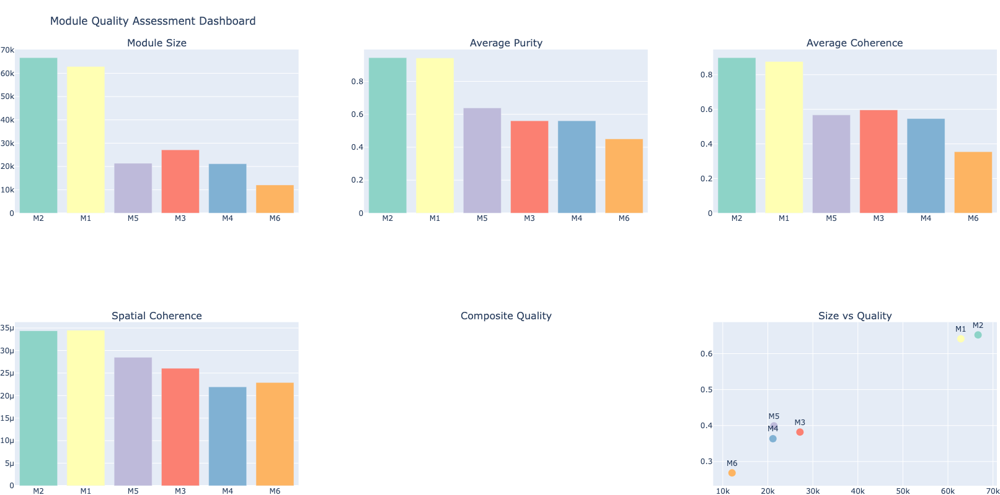


📈 Displaying: Module Rankings


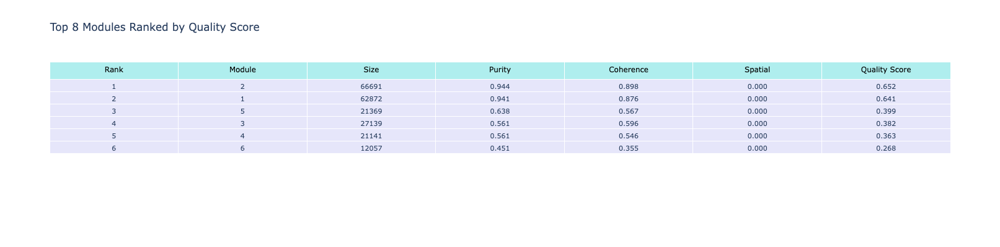


📈 Displaying: Top Modules 3D View



📈 Displaying: Composition by Super_Class


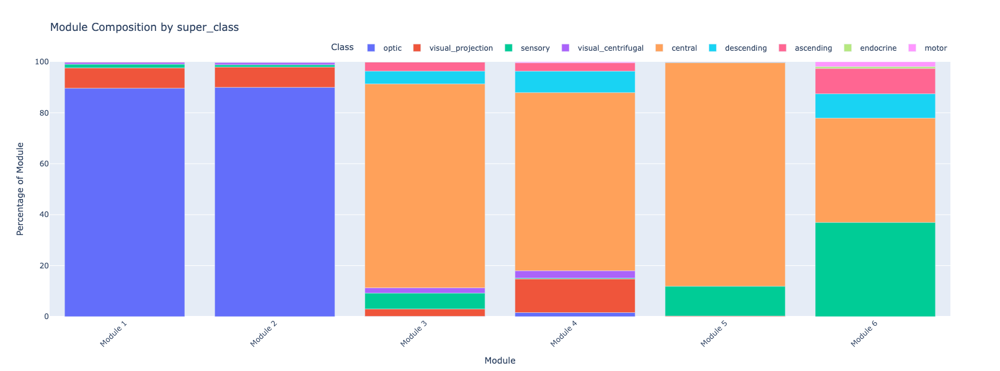


📈 Displaying: Composition by Flow


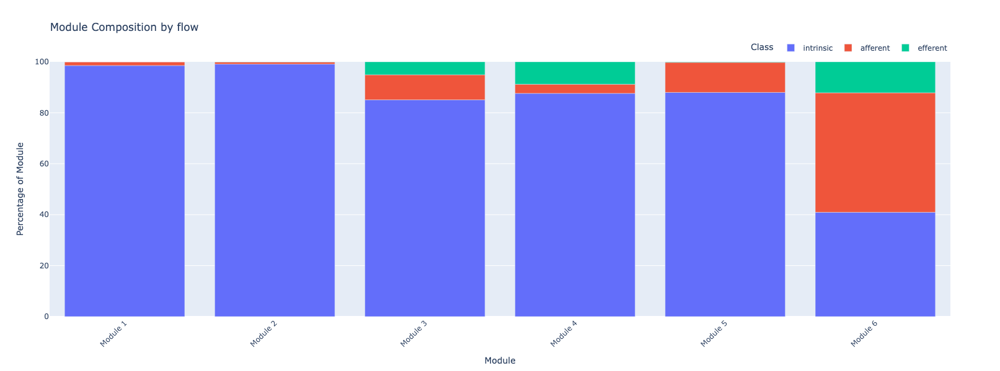


📈 Displaying: Composition by Class


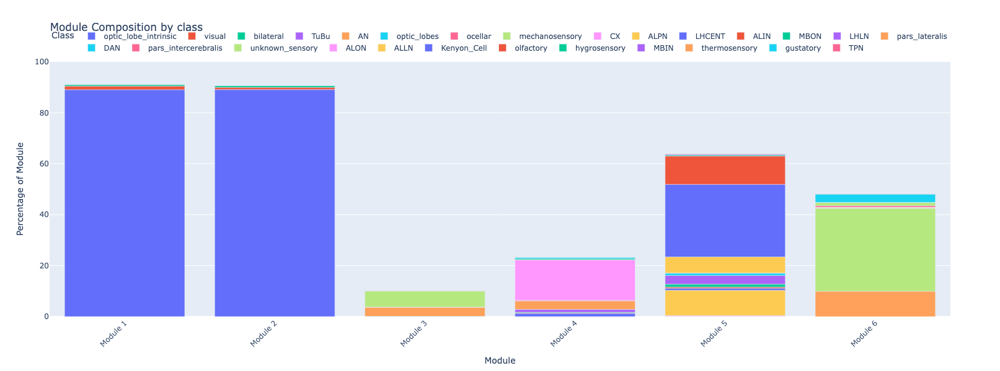


📈 Displaying: Composition by Side


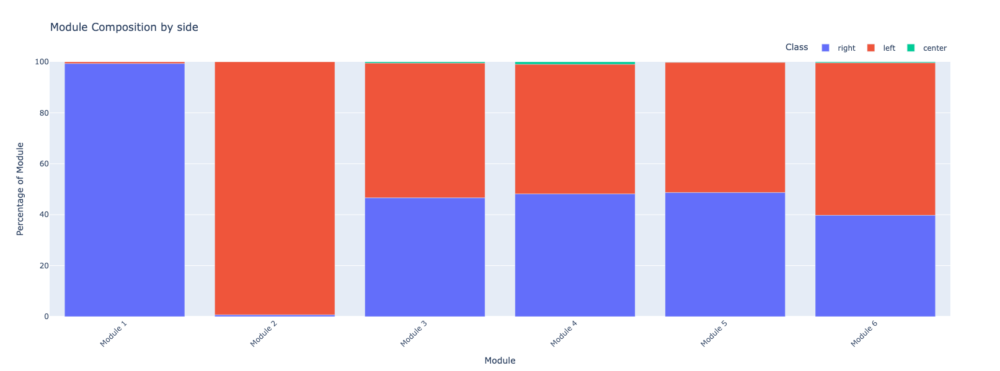


✅ Analysis complete for level_1


In [48]:
from module_quality_analyzer import analyze_top_modules

# Get exactly 4 charts: sizes + rankings + super_class + flow
results, figures = analyze_top_modules(merged_df, level='level_1', top_n=8)